# Caption Generation for Images

In [1]:
!pip install transformers rouge_score evaluate datasets

In [5]:
from transformers import *

In [3]:
pip install xformers

Note: you may need to restart the kernel to use updated packages.


In [6]:
import requests
import torch
from PIL import Image

In [4]:
pip install transformers


Note: you may need to restart the kernel to use updated packages.


In [2]:
#import transformers
#from transformers import VisionEncoderDecoderModel, GPT2TokenizerFast, ViTImageProcessor


In [3]:
!pip install pytest

     -------------------------------------- 323.6/323.6 kB 2.9 MB/s eta 0:00:00


In [6]:
from transformers import *

In [7]:
from tqdm import tqdm
device = "cuda" if torch.cuda.is_available() else "cpu"

In [12]:
# loading a fine-tuned image captioning model,a tokenizer and image processor
finetuned_model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning").to(device)
finetuned_tokenizer = GPT2TokenizerFast.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
finetuned_image_processor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

loading configuration file config.json from cache at C:\Users\Student/.cache\huggingface\hub\models--nlpconnect--vit-gpt2-image-captioning\snapshots\dc68f91c06a1ba6f15268e5b9c13ae7a7c514084\config.json
Model config VisionEncoderDecoderConfig {
  "_commit_hash": "dc68f91c06a1ba6f15268e5b9c13ae7a7c514084",
  "_name_or_path": "vit-gpt-pt",
  "architectures": [
    "VisionEncoderDecoderModel"
  ],
  "bos_token_id": 50256,
  "decoder": {
    "_name_or_path": "",
    "activation_function": "gelu_new",
    "add_cross_attention": true,
    "architectures": [
      "GPT2LMHeadModel"
    ],
    "attn_pdrop": 0.1,
    "bad_words_ids": null,
    "begin_suppress_tokens": null,
    "bos_token_id": 50256,
    "chunk_size_feed_forward": 0,
    "cross_attention_hidden_size": null,
    "decoder_start_token_id": 50256,
    "diversity_penalty": 0.0,
    "do_sample": false,
    "early_stopping": false,
    "embd_pdrop": 0.1,
    "encoder_no_repeat_ngram_size": 0,
    "eos_token_id": 50256,
    "exponential

All the weights of VisionEncoderDecoderModel were initialized from the model checkpoint at nlpconnect/vit-gpt2-image-captioning.
If your task is similar to the task the model of the checkpoint was trained on, you can already use VisionEncoderDecoderModel for predictions without further training.
Generation config file not found, using a generation config created from the model config.
loading file vocab.json from cache at C:\Users\Student/.cache\huggingface\hub\models--nlpconnect--vit-gpt2-image-captioning\snapshots\dc68f91c06a1ba6f15268e5b9c13ae7a7c514084\vocab.json
loading file merges.txt from cache at C:\Users\Student/.cache\huggingface\hub\models--nlpconnect--vit-gpt2-image-captioning\snapshots\dc68f91c06a1ba6f15268e5b9c13ae7a7c514084\merges.txt
loading file tokenizer.json from cache at C:\Users\Student/.cache\huggingface\hub\models--nlpconnect--vit-gpt2-image-captioning\snapshots\dc68f91c06a1ba6f15268e5b9c13ae7a7c514084\tokenizer.json
loading file added_tokens.json from cache at N

In [13]:
import urllib.parse as parse
import os

# is_url function to see if a string is an URL or not
def is_url(string):
    try:
        result = parse.urlparse(string)
        return all([result.scheme, result.netloc, result.path])
    except:
        return False
    
# this function is to load an image
def load_image(image_path):
    if is_url(image_path):
        return Image.open(requests.get(image_path, stream=True).raw)
    elif os.path.exists(image_path):
        return Image.open(image_path)
        

# this function to perform inference
def get_caption(model, image_processor, tokenizer, image_path):
    image = load_image(image_path)
    # preprocess the given image
    img = image_processor(image, return_tensors="pt").to(device)
    # generate the captioby using greedy decode
    output = model.generate(**img)
    caption = tokenizer.batch_decode(output, skip_special_tokens=True)[0] # decode the output
    return caption

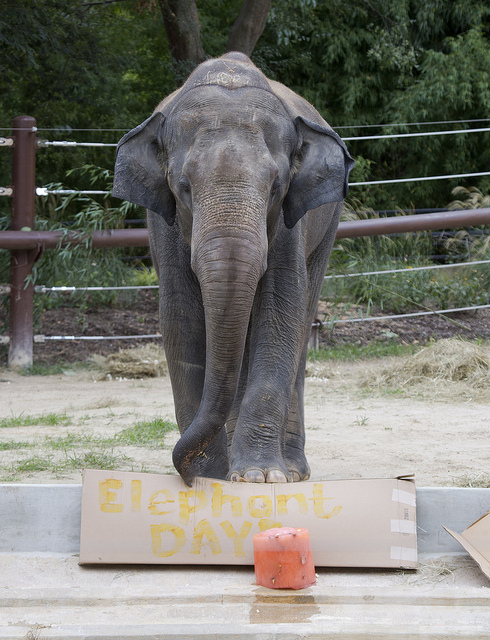

Generate config GenerationConfig {
  "_from_model_config": true,
  "bos_token_id": 50256,
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256,
  "transformers_version": "4.30.1"
}



'an elephant with a large trunk standing on a dirt ground '

In [11]:
# load the images and give captions for it
from IPython.display import display

url = "http://images.cocodataset.org/test-stuff2017/000000000128.jpg"
display(load_image(url))
get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, url)

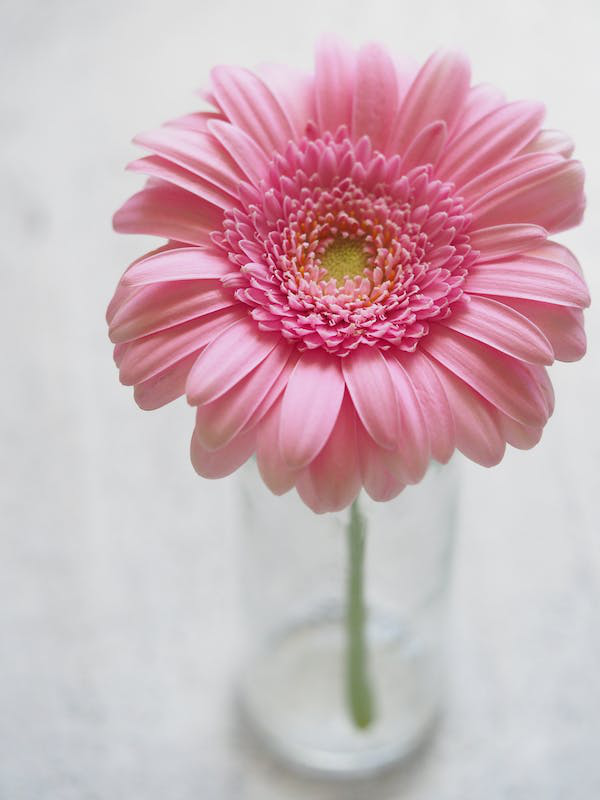

Generate config GenerationConfig {
  "_from_model_config": true,
  "bos_token_id": 50256,
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256,
  "transformers_version": "4.30.1"
}



'a pink rose in a clear vase with water '

In [19]:
#try one more URL
from IPython.display import display

url = "https://images.pexels.com/photos/850359/pexels-photo-850359.jpeg?auto=compress&cs=tinysrgb&w=600"
display(load_image(url))
get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, url)

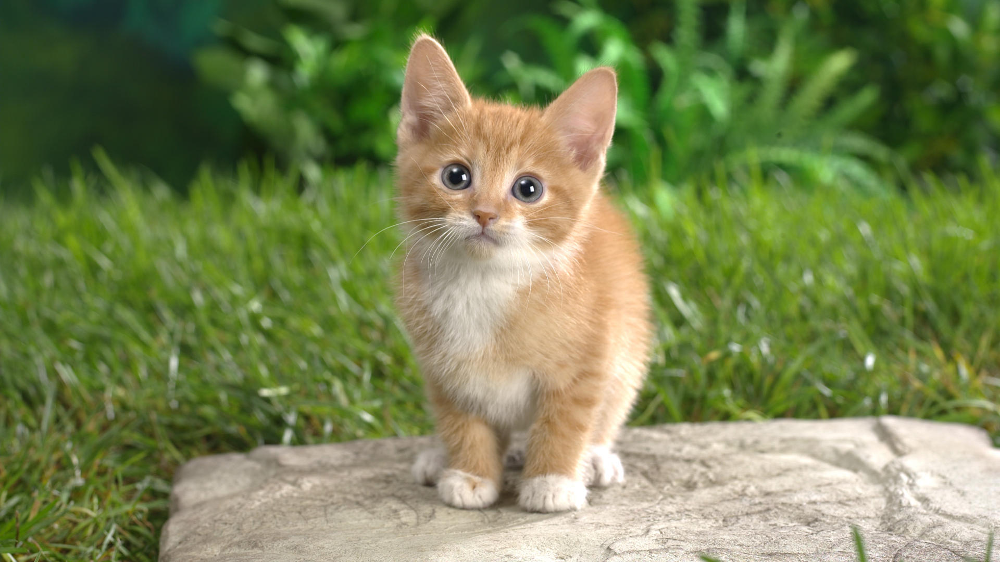

Generate config GenerationConfig {
  "_from_model_config": true,
  "bos_token_id": 50256,
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256,
  "transformers_version": "4.30.1"
}



'a small kitten sitting on a rock near a tree '

In [21]:
#try using saved image in local folder
from IPython.display import display

url = "C:/Users/Student/ImageCaptionGenerator/cat.jpg"
display(load_image(url))
get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, url)

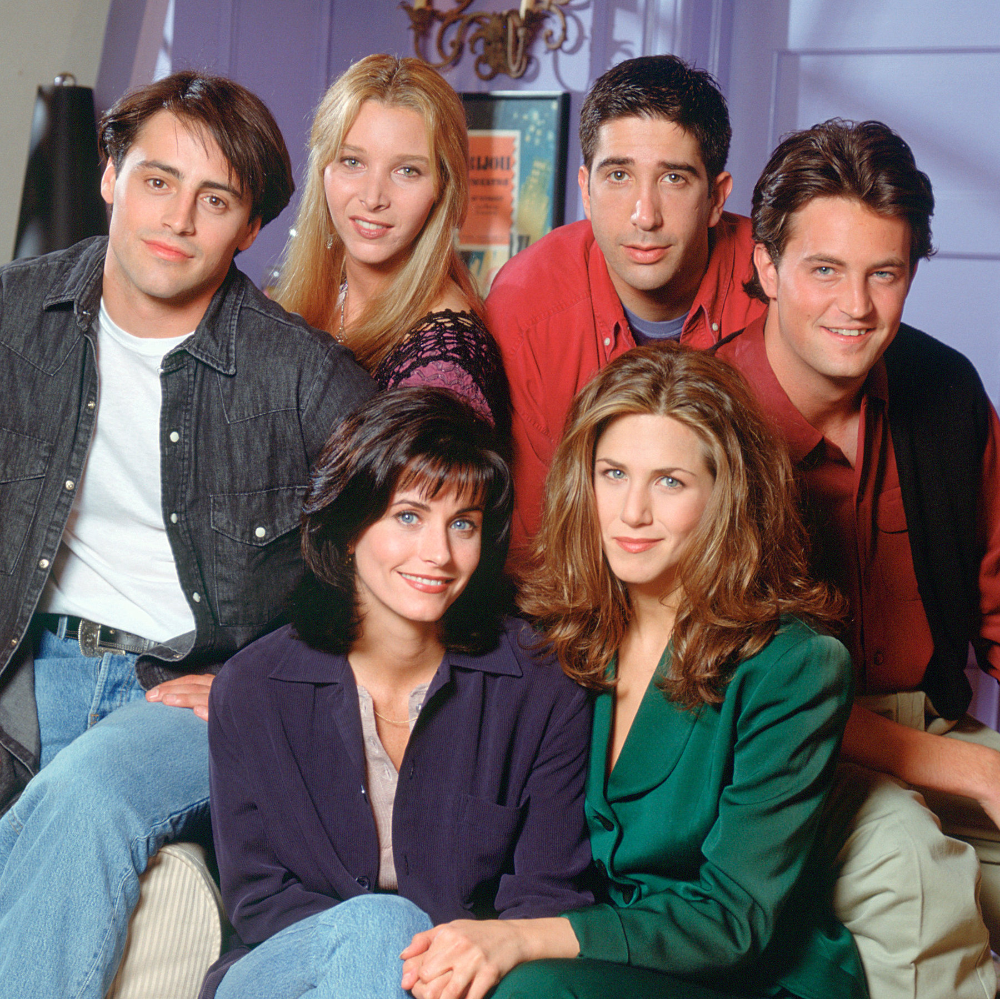

Generate config GenerationConfig {
  "_from_model_config": true,
  "bos_token_id": 50256,
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256,
  "transformers_version": "4.30.1"
}



'a group of people sitting on a couch '

In [22]:
#try using saved image in local folder
from IPython.display import display

url = "C:/Users/Student/ImageCaptionGenerator/friends.jpg"
display(load_image(url))
get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, url)

# Developing my Own model from Scratch

In [23]:
import numpy as np

In [24]:
# the encoder model that process the image and return the image features. 
#let's fine-tune our model from pre-trained encoder and decoder models
encoder_model = "microsoft/swin-base-patch4-window7-224-in22k"
# the decoder model that process the image features and generate the caption text
decoder_model = "gpt2"
# loading the model
model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(
    encoder_model, decoder_model
).to(device)

loading configuration file config.json from cache at C:\Users\Student/.cache\huggingface\hub\models--microsoft--swin-base-patch4-window7-224-in22k\snapshots\68dc76680a5bf3bdf670669f3025dc9be2e30781\config.json
Model config SwinConfig {
  "_name_or_path": "microsoft/swin-base-patch4-window7-224-in22k",
  "architectures": [
    "SwinForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "depths": [
    2,
    2,
    18,
    2
  ],
  "drop_path_rate": 0.1,
  "embed_dim": 128,
  "encoder_stride": 32,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "id2label": {
    "0": "organism, being",
    "1": "benthos",
    "2": "heterotroph",
    "3": "cell",
    "4": "person, individual, someone, somebody, mortal, soul",
    "5": "animal, animate_being, beast, brute, creature, fauna",
    "6": "plant, flora, plant_life",
    "7": "food, nutrient",
    "8": "artifact, artefact",
    "9": "hop",
    "10": "check-in",
    "11": "dressage",
    "12": "curvet

loading weights file model.safetensors from cache at C:\Users\Student/.cache\huggingface\hub\models--microsoft--swin-base-patch4-window7-224-in22k\snapshots\68dc76680a5bf3bdf670669f3025dc9be2e30781\model.safetensors
Some weights of the model checkpoint at microsoft/swin-base-patch4-window7-224-in22k were not used when initializing SwinModel: ['classifier.bias', 'classifier.weight']
- This IS expected if you are initializing SwinModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing SwinModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of SwinModel were initialized from the model checkpoint at microsoft/swin-base-patch4-window7-224-in22k.
If your task is similar to the task the m

In [25]:
# initialize the tokenizer
tokenizer = GPT2TokenizerFast.from_pretrained(decoder_model)
# load the image processor
image_processor = ViTImageProcessor.from_pretrained(encoder_model)

loading file vocab.json from cache at C:\Users\Student/.cache\huggingface\hub\models--gpt2\snapshots\11c5a3d5811f50298f278a704980280950aedb10\vocab.json
loading file merges.txt from cache at C:\Users\Student/.cache\huggingface\hub\models--gpt2\snapshots\11c5a3d5811f50298f278a704980280950aedb10\merges.txt
loading file tokenizer.json from cache at C:\Users\Student/.cache\huggingface\hub\models--gpt2\snapshots\11c5a3d5811f50298f278a704980280950aedb10\tokenizer.json
loading file added_tokens.json from cache at None
loading file special_tokens_map.json from cache at None
loading file tokenizer_config.json from cache at None
loading configuration file config.json from cache at C:\Users\Student/.cache\huggingface\hub\models--gpt2\snapshots\11c5a3d5811f50298f278a704980280950aedb10\config.json
Model config GPT2Config {
  "_name_or_path": "gpt2",
  "activation_function": "gelu_new",
  "architectures": [
    "GPT2LMHeadModel"
  ],
  "attn_pdrop": 0.1,
  "bos_token_id": 50256,
  "embd_pdrop": 0.1,

In [26]:
if "gpt2" in decoder_model:
  # gpt2 does not have decoder_start_token_id and pad_token_id, but has bos_token_id and eos_token_id
  tokenizer.pad_token = tokenizer.eos_token # pad_token_id as eos_token_id
  model.config.eos_token_id = tokenizer.eos_token_id
  model.config.pad_token_id = tokenizer.pad_token_id
  # set decoder_start_token_id as bos_token_id
  model.config.decoder_start_token_id = tokenizer.bos_token_id
else:
  # set the decoder start token id to the CLS token id of the tokenizer
  model.config.decoder_start_token_id = tokenizer.cls_token_id
  # set the pad token id to the pad token id of the tokenizer
  model.config.pad_token_id = tokenizer.pad_token_id

Download and load coco dataset

In [27]:
from datasets import load_dataset

max_length = 32 # max length of the captions in tokens
coco_dataset_ratio = 10 # 10% of the COCO2014 dataset
train_ds = load_dataset("HuggingFaceM4/COCO", split=f"train[:{coco_dataset_ratio}%]")
valid_ds = load_dataset("HuggingFaceM4/COCO", split=f"validation[:{coco_dataset_ratio}%]")
test_ds = load_dataset("HuggingFaceM4/COCO", split="test")
len(train_ds), len(valid_ds), len(test_ds)

No config specified, defaulting to: coco/2014
Found cached dataset coco (C:/Users/Student/.cache/huggingface/datasets/HuggingFaceM4___coco/2014/1.0.0/7dba4b1d9b12e588770263b87c2a1fd7b03072c0a0cf550c896dbd09bf2bb7f8)
No config specified, defaulting to: coco/2014
Found cached dataset coco (C:/Users/Student/.cache/huggingface/datasets/HuggingFaceM4___coco/2014/1.0.0/7dba4b1d9b12e588770263b87c2a1fd7b03072c0a0cf550c896dbd09bf2bb7f8)
No config specified, defaulting to: coco/2014
Found cached dataset coco (C:/Users/Student/.cache/huggingface/datasets/HuggingFaceM4___coco/2014/1.0.0/7dba4b1d9b12e588770263b87c2a1fd7b03072c0a0cf550c896dbd09bf2bb7f8)


(56675, 2501, 25010)

In [13]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [17]:
!pip install imageio

In [18]:
#Trying to remove images with less than 3 dimensions. I am trying to use Image but it doesnt work.
#Mohamad can you help me here??

"""from PIL import Image 
# Define a helper function to filter images with less than 3 dimensions
def filter_images(example):
    image = Image.open(example["image"])
    width, height = image.size
    if len(image.getbands()) >= 3:
        return True
    return False

# Apply the filter function to the datasets
train_ds = train_ds.filter(filter_images, num_proc=2)
valid_ds = valid_ds.filter(filter_images, num_proc=2)
test_ds = test_ds.filter(filter_images, num_proc=2)"""

'from PIL import Image \n# Define a helper function to filter images with less than 3 dimensions\ndef filter_images(example):\n    image = Image.open(example["image"])\n    width, height = image.size\n    if len(image.getbands()) >= 3:\n        return True\n    return False\n\n# Apply the filter function to the datasets\ntrain_ds = train_ds.filter(filter_images, num_proc=2)\nvalid_ds = valid_ds.filter(filter_images, num_proc=2)\ntest_ds = test_ds.filter(filter_images, num_proc=2)'

In [18]:
!pip list

Package                 Version
----------------------- --------
absl-py                 1.3.0
accelerate              0.20.3
aiohttp                 3.8.1
aiosignal               1.3.1
argon2-cffi             20.1.0
asttokens               2.0.5
astunparse              1.6.3
async-timeout           4.0.2
attrs                   21.4.0
backcall                0.2.0
beautifulsoup4          4.11.1
bleach                  4.1.0
blinker                 1.4
Bottleneck              1.3.5
brotlipy                0.7.0
cachetools              5.3.0
certifi                 2023.5.7
cffi                    1.15.1
charset-normalizer      2.0.4
click                   8.0.4
colorama                0.4.4
cryptography            38.0.4
cvlib                   0.2.7
cycler                  0.11.0
datasets                2.12.0
debugpy                 1.5.1
decorator               5.1.1
defusedxml              0.7.1
dill                    0.3.6
entrypoints             0.4
evaluate                0.4.

In [28]:
################NEED HELP HERE ###############################
import numpy as np

# remove the images with less than 3 dimensions (possibly grayscale images)
train_ds = train_ds.filter(lambda item: np.array(item["image"]).ndim in [3, 4], num_proc=2)
valid_ds = valid_ds.filter(lambda item: np.array(item["image"]).ndim in [3, 4], num_proc=2)
test_ds = test_ds.filter(lambda item: np.array(item["image"]).ndim in [3, 4], num_proc=2)



Filter (num_proc=2):   0%|          | 0/56675 [00:00<?, ? examples/s]

NameError: name 'np' is not defined

In [14]:
#pip install accelerate -U

In [30]:
def preprocess(items):
  # preprocess the image
  pixel_values = image_processor(items["image"], return_tensors="pt").pixel_values.to(device)
  # tokenize the caption with truncation and padding
  targets = tokenizer([ sentence["raw"] for sentence in items["sentences"] ], 
                      max_length=max_length, padding="max_length", truncation=True, return_tensors="pt").to(device)
  return {'pixel_values': pixel_values, 'labels': targets["input_ids"]}


# using with_transform to preprocess the dataset during training
train_dataset = train_ds.with_transform(preprocess)
valid_dataset = valid_ds.with_transform(preprocess)
test_dataset  = test_ds.with_transform(preprocess)

In [31]:
# a function we'll use to collate the batches
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.stack([x['labels'] for x in batch])
    }

In [32]:
import evaluate

# load the rouge and bleu metrics
rouge = evaluate.load("rouge")
bleu = evaluate.load("bleu")
  
def compute_metrics(eval_pred):
  preds = eval_pred.label_ids
  labels = eval_pred.predictions
  # decode the predictions and labels
  pred_str = tokenizer.batch_decode(preds, skip_special_tokens=True)
  labels_str = tokenizer.batch_decode(labels, skip_special_tokens=True)
  # compute the rouge score
  rouge_result = rouge.compute(predictions=pred_str, references=labels_str)
  # multiply by 100 to get the same scale as the rouge score
  rouge_result = {k: round(v * 100, 4) for k, v in rouge_result.items()}
  # compute the bleu score
  bleu_result = bleu.compute(predictions=pred_str, references=labels_str)
  # get the length of the generated captions
  generation_length = bleu_result["translation_length"]
  return {
        **rouge_result, 
        "bleu": round(bleu_result["bleu"] * 100, 4), 
        "gen_len": bleu_result["translation_length"] / len(preds)
  }

In [33]:
num_epochs = 2 # number of epochs
batch_size = 16 # the size of batches

In [34]:
for item in train_dataset:
  print(item["labels"].shape)
  print(item["pixel_values"].shape)
  break

torch.Size([32])
torch.Size([3, 224, 224])


In [35]:
# define the training arguments
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,      
    num_train_epochs=num_epochs,           
    evaluation_strategy="steps",    
    eval_steps=2000,                       
    logging_steps=2000,                    
    save_steps=2000,                        
    per_device_train_batch_size=batch_size, 
    per_device_eval_batch_size=batch_size,  
    output_dir="vit-swin-base-224-gpt2-image-captioning", 
)

Found safetensors installation, but --save_safetensors=False. Safetensors should be a preferred weights saving format due to security and performance reasons. If your model cannot be saved by safetensors please feel free to open an issue at https://github.com/huggingface/safetensors!
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [36]:
# instantiate trainer
trainer = Seq2SeqTrainer(
    model=model,                    
    tokenizer=image_processor,      
    args=training_args,              
    compute_metrics=compute_metrics, 
    train_dataset=train_dataset,    
    eval_dataset=valid_dataset,   
    data_collator=collate_fn,   
)

In [37]:
from torch.utils.data import DataLoader

def get_eval_loader(eval_dataset=None):
  return DataLoader(valid_dataset, collate_fn=collate_fn, batch_size=batch_size)

def get_test_loader(eval_dataset=None):
  return DataLoader(test_dataset, collate_fn=collate_fn, batch_size=batch_size)

# override the get_train_dataloader, get_eval_dataloader and
# get_test_dataloader methods of the trainer
# so that we can properly load the data
trainer.get_train_dataloader = lambda: DataLoader(train_dataset, collate_fn=collate_fn, batch_size=batch_size)
trainer.get_eval_dataloader = get_eval_loader
trainer.get_test_dataloader = get_test_loader

In [38]:
# train the model
trainer.train()

C:\Users\Student\.conda\envs\py_39\lib\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
***** Running training *****
  Num examples = 56,675
  Num Epochs = 2
  Instantaneous batch size per device = 16
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 1
  Total optimization steps = 7,086
  Number of trainable parameters = 240,337,080


Step,Training Loss,Validation Loss


ValueError: Unsupported number of image dimensions: 2

In [ ]:
# evaluate on the test_dataset
trainer.evaluate(test_dataset)

In [ ]:
# if you set the push_to_hub parameter in the training arguments, finish the pushing using the below code
trainer.push_to_hub()
# to free up GPU memory
import gc
# del predictions, outputs and labels
torch.cuda.empty_cache()
gc.collect()

The second way would be by using Pytorch Training Loop

In [39]:
# alternate way of training: pytorch loop
from torch.utils.data import DataLoader
# define our data loaders
train_dataset_loader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=batch_size, shuffle=True)
valid_dataset_loader = DataLoader(valid_dataset, collate_fn=collate_fn, batch_size=8, shuffle=True)
test_dataset_loader = DataLoader(test_dataset, collate_fn=collate_fn, batch_size=8, shuffle=True)

In [40]:
from torch.optim import AdamW
# define the optimizer
optimizer = AdamW(model.parameters(), lr=1e-5)

In [41]:
# start tensorboard
%load_ext tensorboard
%tensorboard --logdir ./image-captioning/tensorboard

In [42]:
# Training loop
from torch.utils.tensorboard import SummaryWriter

summary_writer = SummaryWriter(log_dir="./image-captioning/tensorboard")

# print some statistics before training number of training steps
n_train_steps = num_epochs * len(train_dataset_loader)
# number of validation steps
n_valid_steps = len(valid_dataset_loader)
# current training step
current_step = 0
# logging, eval & save steps
save_steps = 1000

In [43]:
for epoch in range(num_epochs):
    model.train()   # set the model to training mode
    # initialize the training loss
    train_loss = 0
    for batch in tqdm(train_dataset_loader, "Training", total=len(train_dataset_loader), leave=False):
      if current_step % save_steps == 0:
        # evaluate on the validation set, if the current step is a multiple of the save steps
        print()
        print(f"Validation at step {current_step}...")
        print()
        # set the model to evaluation mode
        model.eval()
        # initialize our lists that store the predictions and the labels
        predictions, labels = [], []
        # initialize the validation loss
        valid_loss = 0
        for batch in valid_dataset_loader:
            # get the batch
            pixel_values = batch["pixel_values"]
            label_ids = batch["labels"]
            # forward pass
            outputs = model(pixel_values=pixel_values, labels=label_ids)
            # get the loss
            loss = outputs.loss
            valid_loss += loss.item()
            # free the GPU memory
            logits = outputs.logits.detach().cpu()
            # add the predictions to the list
            predictions.extend(logits.argmax(dim=-1).tolist())
            # add the labels to the list
            labels.extend(label_ids.tolist())
        # make the EvalPrediction object that the compute_metrics function expects
        eval_prediction = EvalPrediction(predictions=predictions, label_ids=labels)
        # compute the metrics
        metrics = compute_metrics(eval_prediction)
        # print the stats
        print()
        print(f"Epoch: {epoch}, Step: {current_step}, Train Loss: {train_loss / save_steps:.4f}, " + 
              f"Valid Loss: {valid_loss / n_valid_steps:.4f}, BLEU: {metrics['bleu']:.4f}, " + 
              f"ROUGE-1: {metrics['rouge1']:.4f}, ROUGE-2: {metrics['rouge2']:.4f}, ROUGE-L: {metrics['rougeL']:.4f}")
        print()
        # log the metrics
        summary_writer.add_scalar("valid_loss", valid_loss / n_valid_steps, global_step=current_step)
        summary_writer.add_scalar("bleu", metrics["bleu"], global_step=current_step)
        summary_writer.add_scalar("rouge1", metrics["rouge1"], global_step=current_step)
        summary_writer.add_scalar("rouge2", metrics["rouge2"], global_step=current_step)
        summary_writer.add_scalar("rougeL", metrics["rougeL"], global_step=current_step)
        # save the model
        model.save_pretrained(f"./image-captioning/checkpoint-{current_step}")
        tokenizer.save_pretrained(f"./image-captioning/checkpoint-{current_step}")
        image_processor.save_pretrained(f"./image-captioning/checkpoint-{current_step}")
        # get the model back to train mode
        model.train()
        # reset the train and valid loss
        train_loss, valid_loss = 0, 0
      #training code
      # get the batch & convert to tensor
      pixel_values = batch["pixel_values"]
      labels = batch["labels"]
      outputs = model(pixel_values=pixel_values, labels=labels) # forward pass
      loss = outputs.loss      # get the loss
      loss.backward()          # backward pass
      optimizer.step()         # update the weights
      optimizer.zero_grad()    # zero the gradients
      loss_v = loss.item()     # log the loss
      train_loss += loss_v
      current_step += 1        # increment the step
      # log the training loss
      summary_writer.add_scalar("train_loss", loss_v, global_step=current_step)

Training:   0%|                                                                               | 0/3543 [00:00<?, ?it/s]


Validation at step 0...



Configuration saved in ./image-captioning/checkpoint-0\config.json



Epoch: 0, Step: 0, Train Loss: 0.0000, Valid Loss: 1.2239, BLEU: 4.7491, ROUGE-1: 37.9103, ROUGE-2: 9.0345, ROUGE-L: 35.9676



Configuration saved in ./image-captioning/checkpoint-0\generation_config.json
Model weights saved in ./image-captioning/checkpoint-0\pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-0\tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-0\special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-0\preprocessor_config.json


ValueError: Unsupported number of image dimensions: 2

In [ ]:
# load the best model, change the checkpoint number to the best checkpoint
# if the last checkpoint is the best, then ignore this cell
best_checkpoint = 3000
best_model = VisionEncoderDecoderModel.from_pretrained(f"./image-captioning/checkpoint-{best_checkpoint}").to(device)

Evaluation of Model

In [ ]:
def get_evaluation_metrics(model, dataset):
  model.eval()
  # define dataloader
  dataloader = DataLoader(dataset, collate_fn=collate_fn, batch_size=batch_size)
  # number of test steps
  n_test_steps = len(dataloader)
  # initialize our lists that store the predictions and the labels
  predictions, labels = [], []
  # initialize the test loss
  test_loss = 0.0
  for batch in tqdm(dataloader, "Evaluating"):
      # get the batch
      pixel_values = batch["pixel_values"]
      label_ids = batch["labels"]
      # forward pass
      outputs = model(pixel_values=pixel_values, labels=label_ids)
      # get the loss
      loss = outputs.loss
      test_loss += loss.item()
      # free the GPU memory
      logits = outputs.logits.detach().cpu()
      # add the predictions to the list
      predictions.extend(logits.argmax(dim=-1).tolist())
      # add the labels to the list
      labels.extend(label_ids.tolist())
  # make the EvalPrediction object that the compute_metrics function expects
  eval_prediction = EvalPrediction(predictions=predictions, label_ids=labels)
  # compute the metrics
  metrics = compute_metrics(eval_prediction)
  # add the test_loss to the metrics
  metrics["test_loss"] = test_loss / n_test_steps
  return metrics

In [ ]:
metrics = get_evaluation_metrics(best_model, test_dataset)
metrics
finetuned_metrics = get_evaluation_metrics(finetuned_model, test_dataset)
finetuned_metrics

In [ ]:
# using the pipeline API
image_captioner = pipeline("image-to-text", model="Abdou/vit-swin-base-224-gpt2-image-captioning")
image_captioner.model = image_captioner.model.to(device)
get_evaluation_metrics(image_captioner.model, test_dataset)

#Check the Performance

In [ ]:
def show_image_and_captions(url):
  # get the image and display it
  display(load_image(url))
  # get the captions on various models
  our_caption = get_caption(best_model, image_processor, tokenizer, url)
  finetuned_caption = get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, url)
  pipeline_caption = get_caption(image_captioner.model, image_processor, tokenizer, url)
  # print the captions
  print(f"Our caption: {our_caption}")
  print(f"nlpconnect/vit-gpt2-image-captioning caption: {finetuned_caption}")
  print(f"Abdou/vit-swin-base-224-gpt2-image-captioning caption: {pipeline_caption}")

In [ ]:
show_image_and_captions("http://images.cocodataset.org/test-stuff2017/000000000001.jpg")

In [ ]:
show_image_and_captions("http://images.cocodataset.org/test-stuff2017/000000003072.jpg")

In [ ]:
show_image_and_captions("http://images.cocodataset.org/test-stuff2017/000000003720.jpg")

In [ ]:
import tkinter as tk
from PIL import ImageTk, Image
from io import BytesIO
import requests

# Function to generate captions when the button is clicked
def generate_captions():
    # Get the image URL from the entry field
    image_url = entry.get()

    # Get the image and display it
    response = requests.get(image_url)
    image = Image.open(BytesIO(response.content))
    image = image.resize((400, 400))  # Adjust the size as needed
    photo = ImageTk.PhotoImage(image)
    label.config(image=photo)
    label.image = photo

    # Generate the captions
    our_caption = get_caption(best_model, image_processor, tokenizer, image_url)
    finetuned_caption = get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, image_url)
    pipeline_caption = get_caption(image_captioner.model, image_processor, tokenizer, image_url)

    # Print the captions
    caption_text.delete("1.0", tk.END)  # Clear previous captions
    caption_text.insert(tk.END, f"Our caption: {our_caption}\n")
    caption_text.insert(tk.END, f"nlpconnect/vit-gpt2-image-captioning caption: {finetuned_caption}\n")
    caption_text.insert(tk.END, f"Abdou/vit-swin-base-224-gpt2-image-captioning caption: {pipeline_caption}\n")

# Create the main window
window = tk.Tk()
window.title("Image Caption Generator")

# Create the URL entry field
entry = tk.Entry(window, width=50)
entry.pack()

# Create the Generate Captions button
button = tk.Button(window, text="Generate Captions", command=generate_captions)
button.pack()

# Create the image display label
label = tk.Label(window)
label.pack()

# Create the caption display text box
caption_text = tk.Text(window, height=5, width=50)
caption_text.pack()

# Start the Tkinter event loop
window.mainloop()


In [ ]:
#either use this enhansed Front end
import tkinter as tk
from PIL import ImageTk, Image
from io import BytesIO
import requests

# Function to generate captions when the button is clicked
def generate_captions():
    # Get the image URL from the entry field
    image_url = entry.get()

    # Get the image and display it
    response = requests.get(image_url)
    image = Image.open(BytesIO(response.content))
    image = image.resize((400, 400))  # Adjust the size as needed
    photo = ImageTk.PhotoImage(image)
    label.config(image=photo)
    label.image = photo

    # Generate the captions
    our_caption = get_caption(best_model, image_processor, tokenizer, image_url)
    finetuned_caption = get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, image_url)
    pipeline_caption = get_caption(image_captioner.model, image_processor, tokenizer, image_url)

    # Update the caption labels
    our_caption_label.config(text=f"Our Caption: {our_caption}")
    finetuned_caption_label.config(text=f"nlpconnect/vit-gpt2-image-captioning Caption: {finetuned_caption}")
    pipeline_caption_label.config(text=f"Abdou/vit-swin-base-224-gpt2-image-captioning Caption: {pipeline_caption}")

# Create the main window
window = tk.Tk()
window.title("Image Caption Generator")

# Create the URL entry field
entry_frame = tk.Frame(window)
entry_frame.pack(pady=10)
entry_label = tk.Label(entry_frame, text="Enter Image URL:")
entry_label.pack(side=tk.LEFT)
entry = tk.Entry(entry_frame, width=50)
entry.pack(side=tk.LEFT)

# Create the Generate Captions button
button_frame = tk.Frame(window)
button_frame.pack(pady=10)
button = tk.Button(button_frame, text="Generate Captions", command=generate_captions, padx=20, pady=10, bg="blue", fg="white")
button.pack()

# Create the image display label
label = tk.Label(window)
label.pack()

# Create the caption labels
our_caption_label = tk.Label(window, text="Our Caption:", font=("Helvetica", 14), pady=10)
our_caption_label.pack()
finetuned_caption_label = tk.Label(window, text="nlpconnect/vit-gpt2-image-captioning Caption:", font=("Helvetica", 14), pady=10)
finetuned_caption_label.pack()
pipeline_caption_label = tk.Label(window, text="Abdou/vit-swin-base-224-gpt2-image-captioning Caption:", font=("Helvetica", 14), pady=10)
pipeline_caption_label.pack()

# Start the Tkinter event loop
window.mainloop()


In [ ]:
import tkinter as tk
from PIL import ImageTk, Image
from io import BytesIO
import requests

# Function to generate captions when the button is clicked
def generate_captions():
    # Get the image URL from the entry field
    image_url = entry.get()

    # Get the image and display it
    response = requests.get(image_url)
    image = Image.open(BytesIO(response.content))
    image = image.resize((400, 400))  # Adjust the size as needed
    photo = ImageTk.PhotoImage(image)
    label.config(image=photo)
    label.image = photo

    # Generate the captions
    our_caption = get_caption(best_model, image_processor, tokenizer, image_url)
    finetuned_caption = get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, image_url)
    pipeline_caption = get_caption(image_captioner.model, image_processor, tokenizer, image_url)

    # Update the caption labels
    our_caption_label.config(text=f"Our Caption: {our_caption}")
    finetuned_caption_label.config(text=f"nlpconnect/vit-gpt2-image-captioning Caption: {finetuned_caption}")
    pipeline_caption_label.config(text=f"Abdou/vit-swin-base-224-gpt2-image-captioning Caption: {pipeline_caption}")

# Create the main window
window = tk.Tk()
window.title("Image Caption Generator")

# Set the window size and position
window.geometry("600x600+300+100")

# Create a canvas and set the background image
canvas = tk.Canvas(window, width=600, height=600)
bg_image = ImageTk.PhotoImage(Image.open("background_image.jpg"))  # Replace with your own image file
canvas.create_image(0, 0, anchor=tk.NW, image=bg_image)
canvas.pack()

# Create the URL entry field
entry_frame = tk.Frame(window, bg="white")
entry_frame.place(relx=0.5, rely=0.1, relwidth=0.8, anchor=tk.CENTER)
entry_label = tk.Label(entry_frame, text="Enter Image URL:", bg="white")
entry_label.pack(side=tk.LEFT)
entry = tk.Entry(entry_frame, width=50)
entry.pack(side=tk.LEFT)

# Create the Generate Captions button
button_frame = tk.Frame(window, bg="white")
button_frame.place(relx=0.5, rely=0.2, anchor=tk.CENTER)
button = tk.Button(button_frame, text="Generate Captions", command=generate_captions, padx=20, pady=10, bg="blue", fg="white")
button.pack()

# Create the image display label
label = tk.Label(window, bg="white")
label.place(relx=0.5, rely=0.35, anchor=tk.CENTER)

# Create the caption labels
our_caption_label = tk.Label(window, text="Our Caption:", font=("Helvetica", 14), pady=10, bg="white")
our_caption_label.place(relx=0.5, rely=0.7, anchor=tk.CENTER)
finetuned_caption_label = tk.Label(window, text="nlpconnect/vit-gpt2-image-captioning Caption:", font=("Helvetica", 14), pady=10, bg="white")
finetuned_caption_label.place(relx=0.5, rely=0.75, anchor=tk.CENTER)
pipeline_caption_label = tk.Label(window, text="Abdou/vit-swin-base-224-gpt2-image-captioning Caption:", font=("Helvetica", 14), pady=10, bg="white")
pipeline_caption_label.place(relx=0.5, rely=0.8, anchor=tk.CENTER)

# Start the Tkinter event loop
window.mainloop()
